# Measuring the kSZ effect with power spectra

This tutorial showcases a measurement of the kinematic Sunyaev-Zel'dovich (kSZ) effect via the kSZ-galaxy power spectrum. It follows the method outlined in Harscouet et al. 2025 *(in prep)* (H25). In this notebook, we measure the kSZ effect on real data, namely the ACT DR6 temperature map and the DESI Y1 Luminous Red Galaxy (LRG) spectroscopic sample. 

In [2]:
import numpy as np
import pymaster as nmt
import pymaster.utils as ut
from astropy.io import fits
import matplotlib.pyplot as plt
from pixell import enmap, reproject, enplot

### Loading the data

We start by importing the data:
- **GALAXIES**: you will need
    - a catalog ($\rightarrow$ `gal_data["cat"]`) containing positions (`RA` and `DEC`) as well as an estimate of the peculiar velocity of each galaxy along the line of sight `vR`; 
    - a mask ($\rightarrow$ `gal_data["mask"]`) tracking the number density of galaxies across the survey footprint; 
- **CMB TEMPERATURE**: you will need
    - a component-separated "CMB+kSZ" map ($\rightarrow$ `ksz_data["map"]`); 
    - an apodized mask ($\rightarrow$ `ksz_data["mask"]`) representing the ACT survey geometry.

The ACT collaboration uses the CAR pixelization scheme for their data products, so we use their own [`pixell`](https://pixell.readthedocs.io/en/latest/index.html) library to handle all maps and masks. 

In [2]:
dir = 'your/data/directory'
gal_data = {"cat": f'{dir}/LRG_Y1_cigale_masked.fits', 
            "mask": f'{dir}/LRG_Y1_mask.fits'}
ksz_data = {"map": f'{dir}/hilc_fullRes_TT_17000.fits', 
            "mask": f'{dir}/wide_mask_GAL070_apod_1.50_deg_wExtended_srcfree_Will.fits'}

In [3]:
print("Reading catalog and map...")
# Galaxy catalog
gcat = fits.open(gal_data['cat'])[1].data
vr = gcat['vR'] # reading individual columns
ra = gcat['RA']
dec = gcat['DEC']
# Temperature map
tmap = enmap.read_map(ksz_data["map"])

print("Reading masks...")
gmask = enmap.read_map(gal_data['mask']) # galaxy mask
tmask = enmap.read_map(ksz_data["mask"]) # temperature mask

Reading catalog and map...
Reading masks...


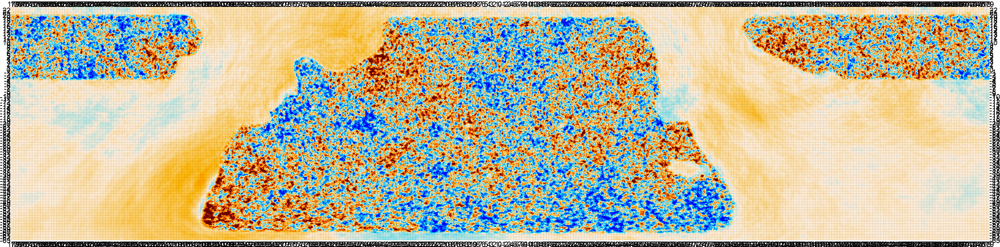

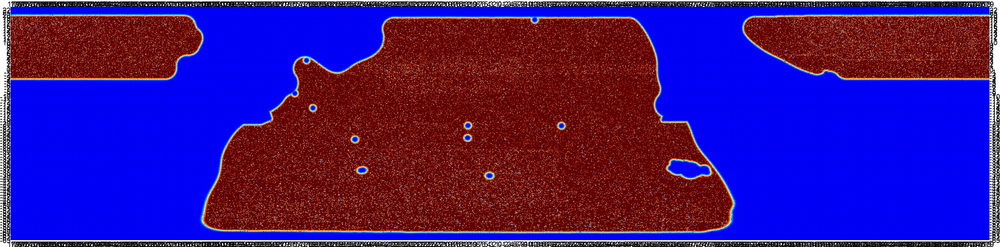

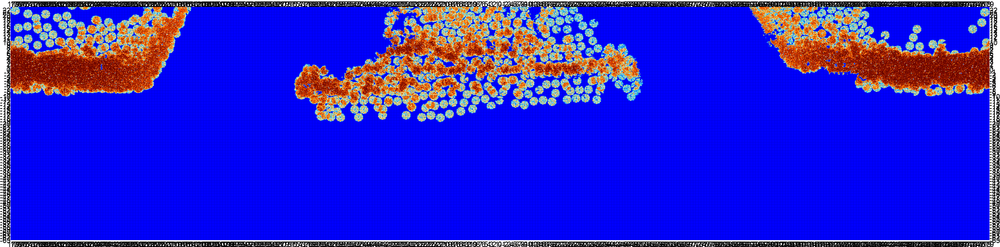

In [15]:
# Inspecting the maps and masks

# We first lower the resolution of the mask for quicker visualisation
tmap_dg = enmap.downgrade(tmap, 16) 
enplot.show(enplot.plot(tmap_dg))

tmask_dg = enmap.downgrade(tmask, 16)
enplot.show(enplot.plot(tmask_dg))

gmask_dg = enmap.downgrade(gmask, 16) 
enplot.show(enplot.plot(gmask_dg))

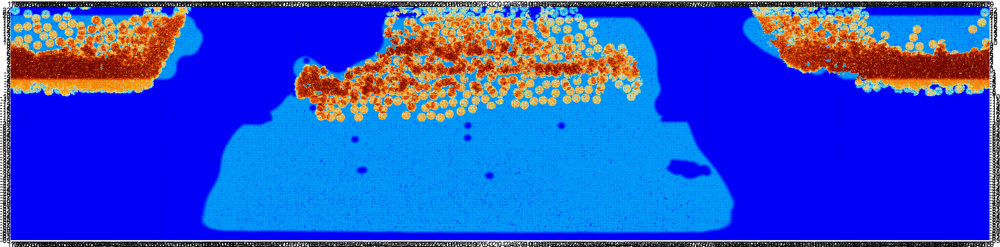

In [9]:
# Let's show both masks at the same time:
enplot.show(enplot.plot(tmask_dg+gmask_dg))

Some of the LRG sample does not overlap with the ACT footprint! One could remove these additional galaxies from the catalog, and update the mask accordingly, but H25 showed that this does not affect the signal-to-noise ratio of the final $C_b^{\pi T}$ significantly.

### Defining the `NaMaster` fields

As described in Harscouet et al. *(in prep)*, we measure the cross power spectrum $C_\ell^{\pi T}$ between a *temperature* field $T$ and a *momentum* field $\pi \propto \int dz\,p(z)\,(1 + \delta) v$ (where $\delta$ is the galaxy density field, and $v$ is the associated velocity field). 

To avoid small-scales effects such as aliasing (due to pixelization) and shot noise (due to the stochastic nature of the sampled galaxy field), we use the catalog-based framework to describe the momentum field (see [Wolz et al. 2025](https://arxiv.org/abs/2407.21013)). Because the momentum field depends on both galaxy positions and another field (their velocities) sampled at those positions, we will use a child class of the base NaMaster `NmtField`, called `NmtFieldCatalogMomentum` which takes both as input and represents such a field.

In [1]:
# MOMENTUM FIELD
ngal = len(ra) # Number of galaxies in the catalog
print('ngal=', ngal)
w = np.ones(ngal) # We assign unit weights to all galaxies

# We choose a multipole up to which we compute the spherical harmonic transform
nside = 4096; lmax = 3*nside - 1 
# Note that nside here is only used to define lmax, 
# and to go back and forth between healpix and CAR pixelization schemes 
# (see next section about covariance)

print("Computing galaxy mask...")
# We define a mask field used in the covariance workspace later on
f_gmask = nmt.NmtField(gmask, None, wcs=gmask.wcs, spin=0, lmax=lmax, lmax_mask=lmax) 

print("Computing momentum field...")
f_catmom = nmt.NmtFieldCatalogMomentum(np.array([ra, dec]), w, vr,
                                       None, None, 
                                       lmax=lmax, 
                                       lmax_mask = lmax,
                                       mask=gmask,
                                       wcs = gmask.wcs,
                                       lonlat=True)

ngal= 1578206
Computing galaxy mask...
Computing momentum field...


In [5]:
# TEMPERATURE FIELD
print("Computing temperature field...")
f_tmap = nmt.NmtField(tmask, [tmap], wcs=tmap.wcs, lmax=lmax,
                      lmax_mask=lmax, masked_on_input=True)

Computing temperature field...


### Computing $C_\ell^{\pi T}$ and its covariance

We now have nearly all the ingredients to compute the kSZ-galaxy power spectrum and its covariance: we just need to choose a binning scheme, which we will use to bin the measured pseudo-$C_\ell$ into bandpowers. 

In [4]:
# BINNING SCHEME
nbins = 20
lpb = int((lmax)/nbins) # Bandpower width
print(lpb, 'ells per bin')

b = nmt.NmtBin.from_lmax_linear(lmax, lpb)
binned_ells = b.get_effective_ells()
print(binned_ells)

614 ells per bin
[  308.5   922.5  1536.5  2150.5  2764.5  3378.5  3992.5  4606.5  5220.5
  5834.5  6448.5  7062.5  7676.5  8290.5  8904.5  9518.5 10132.5 10746.5
 11360.5 11974.5]


In [9]:
# POWER SPECTRA
# Compute pseudo-cls and decoupled cls

print("Computing PCLs...")
# We need all three power spectra to compute the covariance, 
# although the cross-correlation is the one we are interested in
pcl_pT = nmt.compute_coupled_cell(f_catmom, f_tmap)
pcl_TT = nmt.compute_coupled_cell(f_tmap, f_tmap)
pcl_pp = nmt.compute_coupled_cell(f_catmom, f_catmom) + f_catmom.Nf
# Note that the "zero-lag" correlation function (Nf here) is subtracted by default
# in the auto-spectrum of catalog fields. We need to add this back for the purposes
# of covariance calculation, since it's an essential source of noise.

print("Computing workspace...")
wsp_pT = nmt.NmtWorkspace(f_catmom, f_tmap, b)

print("Decoupling PCL...")
cl_pT = wsp_pT.decouple_cell(pcl_pT)

Computing PCLs...
Computing workspaces...
Decoupling PCLs...


For the covariance we use the improved Narrow-Kernel Approximation (iNKA), originally introduced in [Garcia-Garcia et al. (2019)](https://arxiv.org/abs/1906.11765) and then improved in [Nicola et al. (2020)](https://arxiv.org/abs/2010.09717). The input power spectra in this approximation should be rescaled by their effective survey sky fraction, and should not be shot noise subtracted. To estimate the effective sky fraction easily, we first go back to the equal-area HEALPix projection of the map, and take the average of the squared mask there. 

In [10]:
# COVARIANCE

print("Computing fsky...")
# We reproject the CAR masks to healpy for easy manipulation
gmask_hp = reproject.map2healpix(gmask, nside, method="spline", order=1) 
tmask_hp = reproject.map2healpix(tmask, nside, method="spline", order=1) 
# Computing the corresponding effective sky fractions
fsky_ksz = np.mean(tmask_hp**2) 
fsky_lrg = np.mean(gmask_hp**2) 
fsky_comb = np.mean((tmask_hp) * (gmask_hp)) 

print("Computing covariance workspace...")
# This takes 10 min on a 10-core machine!
# This is due to the large ell_max we use here.
# It is recommended to run this on several cores.
cw = nmt.NmtCovarianceWorkspace.from_fields(f_tmap, f_gmask, f_tmap, f_gmask) 

print("Computing covariance...")
covar = nmt.gaussian_covariance(
        cw,
        0, 0, 0, 0,
        [pcl_pp.squeeze()/fsky_lrg],  
        [pcl_pT.squeeze()/fsky_comb],  
        [pcl_pT.squeeze()/fsky_comb],  
        [pcl_TT.squeeze()/fsky_ksz],  
        wsp_pT, wb=wsp_pT)

Computing fsky...
Computing covariance workspace...
Computing covariance...


All done! Now we can plot the result:

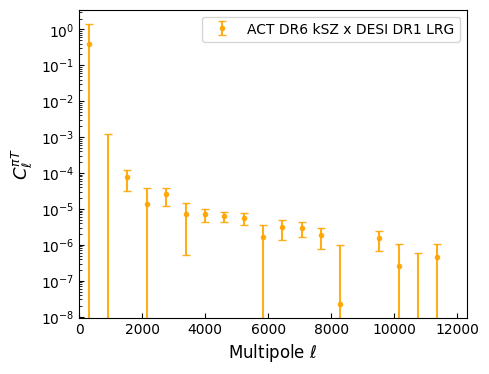

In [7]:
plt.figure(figsize=(5,4))
plt.tick_params(axis='both', which='both', direction="in")
plt.errorbar(binned_ells, cl_pT.squeeze(), yerr=np.sqrt(np.diag(covar)), 
             ls='none', marker='.', color='orange', alpha=0.9, 
             capsize=3, label='ACT DR6 kSZ x DESI DR1 LRG')
plt.ylabel(r'$C_\ell^{\pi T}$', fontsize=13)
plt.xlabel(r'Multipole $\ell$', fontsize=12)
plt.xlim(0,3*nside); plt.semilogy()
plt.legend(); 